In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import seaborn as sns
import statsmodels.api as sm

mpl.rcParams['figure.figsize'] = (10, 8)
mpl.rcParams['axes.grid'] = False

### Data Preparation

In [2]:
df_power= pd.read_csv('power_actual.csv')

In [3]:
df_weather=pd.read_csv('weather_actuals.csv')

In [4]:
df_power.isnull().sum()

Unnamed: 0        0
datetime          0
ghi           35040
gti           35040
power             0
dtype: int64

In [5]:
df_power.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70080 entries, 0 to 70079
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  70080 non-null  int64  
 1   datetime    70080 non-null  object 
 2   ghi         35040 non-null  float64
 3   gti         35040 non-null  float64
 4   power       70080 non-null  float64
dtypes: float64(3), int64(1), object(1)
memory usage: 2.7+ MB


In [6]:
df_power.replace(np.nan,method='ffill',inplace=True)

Unnamed: 0    None
datetime      None
ghi           None
gti           None
power         None
dtype: object

In [7]:
df_power.describe()

,Unnamed: 0,ghi,gti,power
count,70080.000000,70080.0,70080.0,70080.000000
mean,35039.500000,0.0,0.0,28.612915
std,20230.497769,0.0,0.0,498.795887
min,0.000000,0.0,0.0,0.000000
25%,17519.750000,0.0,0.0,0.000000
50%,35039.500000,0.0,0.0,0.000000
75%,52559.250000,0.0,0.0,5.540000
max,70079.000000,0.0,0.0,16172.040000


### Creating date and time field

In [8]:
df_power['datetime']=pd.to_datetime(df_power['datetime'])

In [9]:
df_power.describe()

,Unnamed: 0,ghi,gti,power
count,70080.000000,70080.0,70080.0,70080.000000
mean,35039.500000,0.0,0.0,28.612915
std,20230.497769,0.0,0.0,498.795887
min,0.000000,0.0,0.0,0.000000
25%,17519.750000,0.0,0.0,0.000000
50%,35039.500000,0.0,0.0,0.000000
75%,52559.250000,0.0,0.0,5.540000
max,70079.000000,0.0,0.0,16172.040000


In [10]:
df_power.tail()

,Unnamed: 0,datetime,ghi,gti,power
70075,70075,2019-09-30 22:45:00,0.0,0.0,0.0
70076,70076,2019-09-30 23:00:00,0.0,0.0,0.0
70077,70077,2019-09-30 23:15:00,0.0,0.0,0.0
70078,70078,2019-09-30 23:30:00,0.0,0.0,0.0
70079,70079,2019-09-30 23:45:00,0.0,0.0,0.0


### EDA

In [11]:
df_power.max()

Unnamed: 0                  70079
datetime      2019-09-30 23:45:00
ghi                             0
gti                             0
power                       16172
dtype: object

In [12]:
fig=px.line(df_power,x='datetime',y='power',title='Energy generation')

fig.update_xaxes(
    rangeslider_visible= True,
    rangeselector=dict(
                        buttons = list([
                        dict(count = 1,label = '1m',step='month',stepmode = "backward"),
                        dict(count = 2,label = '6m',step='month',stepmode = "backward"),
                        dict(count = 3,label = '6mYTD',step='month',stepmode = "todate"),
                        dict(count = 4,label = '2y',step='year',stepmode = "backward"),
                        dict(count = 5,label = '3y',step='year',stepmode = "backward"),
                        dict(step= 'all')
                            ])        
                        )
                   )
fig.show()

In [13]:
df_power.set_index('datetime')

,Unnamed: 0,ghi,gti,power
datetime,,,,
2017-10-01 00:00:00,0,0.0,0.0,0.0
2017-10-01 00:15:00,1,0.0,0.0,0.0
2017-10-01 00:30:00,2,0.0,0.0,0.0
2017-10-01 00:45:00,3,0.0,0.0,0.0
2017-10-01 01:00:00,4,0.0,0.0,0.0
...,...,...,...,...
2019-09-30 22:45:00,70075,0.0,0.0,0.0
2019-09-30 23:00:00,70076,0.0,0.0,0.0
2019-09-30 23:15:00,70077,0.0,0.0,0.0


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

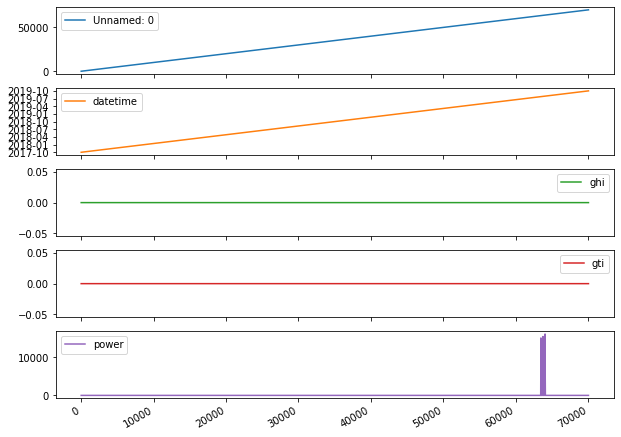

In [14]:
df_power.plot(subplots=True)

In [15]:
df_power=df_power.drop(['ghi', 'gti','Unnamed: 0'], axis=1)

In [16]:
pd.date_range(start = '2017-10-01', end = '2019-09-30' ).difference(df_power.index)

DatetimeIndex(['2017-10-01', '2017-10-02', '2017-10-03', '2017-10-04',
               '2017-10-05', '2017-10-06', '2017-10-07', '2017-10-08',
               '2017-10-09', '2017-10-10',
               ...
               '2019-09-21', '2019-09-22', '2019-09-23', '2019-09-24',
               '2019-09-25', '2019-09-26', '2019-09-27', '2019-09-28',
               '2019-09-29', '2019-09-30'],
              dtype='datetime64[ns]', length=730, freq=None)

In [17]:
df_n=df_power.copy()

### Filling missing dates data with moving average

In [18]:
df = df_power.resample('1H', on='datetime').mean()

In [19]:
df.head(10)

,power
datetime,
2017-10-01 00:00:00,0.0000
2017-10-01 01:00:00,0.0000
2017-10-01 02:00:00,0.0000
2017-10-01 03:00:00,0.0000
2017-10-01 04:00:00,0.0000
2017-10-01 05:00:00,0.0000
2017-10-01 06:00:00,0.0200
2017-10-01 07:00:00,1.1925
2017-10-01 08:00:00,5.1375


In [20]:
df.max()

power    15091.685
dtype: float64

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17520 entries, 2017-10-01 00:00:00 to 2019-09-30 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   power   17520 non-null  float64
dtypes: float64(1)
memory usage: 273.8 KB


In [22]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13619 entries, 0 to 13618
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            13619 non-null  int64  
 1   plant_id              13619 non-null  int64  
 2   datetime_utc          13619 non-null  object 
 3   datetime_local        13619 non-null  object 
 4   cloud_cover           13619 non-null  float64
 5   apparent_temperature  13619 non-null  float64
 6   temperature           13619 non-null  int64  
 7   humidity              13619 non-null  int64  
 8   dew_point             13619 non-null  float64
 9   wind_bearing          13619 non-null  int64  
 10  wind_speed            13619 non-null  float64
 11  wind_chill            3744 non-null   float64
 12  wind_gust             13619 non-null  float64
 13  heat_index            3744 non-null   float64
 14  pressure              13619 non-null  float64
 15  qpf                

In [23]:
df_weather

,Unnamed: 0,plant_id,datetime_utc,datetime_local,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,...,precip_accumulation,precip_intensity,precip_probability,precip_type,visibility,sunrise,sunset,icon,summary,updated_at
0,0,1,2017-09-30 18:30:00,2017-10-01 00:00:00,0.00,26.52,26,1,19.46,308,...,-9999.0,-9999.0,-9999.0,rain,3.57,2017-10-01 00:52:02,2017-10-01 12:45:07,clear-night,Clear,2019-07-16 16:37:16
1,1,1,2017-09-30 19:30:00,2017-10-01 01:00:00,0.00,28.78,27,1,20.06,-9999,...,-9999.0,-9999.0,-9999.0,rain,3.06,2017-10-01 00:52:02,2017-10-01 12:45:07,fog,Foggy,2019-07-16 16:37:16
2,2,1,2017-09-30 20:30:00,2017-10-01 02:00:00,0.00,26.58,26,1,19.97,-9999,...,-9999.0,-9999.0,-9999.0,rain,3.06,2017-10-01 00:52:02,2017-10-01 12:45:07,fog,Foggy,2019-07-16 16:37:16
3,3,1,2017-09-30 21:30:00,2017-10-01 03:00:00,0.00,23.84,23,1,18.66,270,...,-9999.0,-9999.0,-9999.0,rain,3.56,2017-10-01 00:52:02,2017-10-01 12:45:07,clear-night,Clear,2019-07-16 16:37:16
4,4,1,2017-09-30 22:30:00,2017-10-01 04:00:00,0.00,24.13,24,1,17.84,-9999,...,-9999.0,-9999.0,-9999.0,rain,3.06,2017-10-01 00:52:02,2017-10-01 12:45:07,fog,Foggy,2019-07-16 16:37:16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13614,13614,1,2019-09-30 13:30:00,2019-09-30 19:00:00,0.16,31.66,29,1,21.19,40,...,NaN,0.0,0.0,NaN,16.09,2019-09-30 00:51:16,2019-09-30 12:46:54,partly-cloudy-night,Partly Cloudy,2019-10-01 23:32:46
13615,13615,1,2019-09-30 14:30:00,2019-09-30 20:00:00,0.16,30.42,28,1,21.35,59,...,NaN,0.0,0.0,NaN,16.09,2019-09-30 00:51:16,2019-09-30 12:46:54,partly-cloudy-night,Partly Cloudy,2019-10-01 23:32:46
13616,13616,1,2019-09-30 15:30:00,2019-09-30 21:00:00,0.18,29.56,27,1,21.61,76,...,NaN,0.0,0.0,NaN,16.09,2019-09-30 00:51:16,2019-09-30 12:46:54,partly-cloudy-night,Partly Cloudy,2019-10-01 23:32:46
13617,13617,1,2019-09-30 16:30:00,2019-09-30 22:00:00,0.30,28.97,27,1,21.99,88,...,NaN,0.0,0.0,NaN,16.09,2019-09-30 00:51:16,2019-09-30 12:46:54,partly-cloudy-night,Partly Cloudy,2019-10-01 23:32:46


In [24]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13619 entries, 0 to 13618
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            13619 non-null  int64  
 1   plant_id              13619 non-null  int64  
 2   datetime_utc          13619 non-null  object 
 3   datetime_local        13619 non-null  object 
 4   cloud_cover           13619 non-null  float64
 5   apparent_temperature  13619 non-null  float64
 6   temperature           13619 non-null  int64  
 7   humidity              13619 non-null  int64  
 8   dew_point             13619 non-null  float64
 9   wind_bearing          13619 non-null  int64  
 10  wind_speed            13619 non-null  float64
 11  wind_chill            3744 non-null   float64
 12  wind_gust             13619 non-null  float64
 13  heat_index            3744 non-null   float64
 14  pressure              13619 non-null  float64
 15  qpf                

In [25]:
df_weather.precip_type.value_counts()

rain     6147
-9999     343
Name: precip_type, dtype: int64

In [26]:
df_weather.precip_type.unique()

array(['rain', '-9999', nan], dtype=object)

In [27]:
df_weather.corr()

,Unnamed: 0,plant_id,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_chill,...,qpf,uv_index,snow,pop,fctcode,ozone,precip_accumulation,precip_intensity,precip_probability,visibility
Unnamed: 0,1.000000,NaN,0.214831,0.506807,0.459176,-0.082972,0.245485,0.365803,0.336288,NaN,...,NaN,0.739429,NaN,NaN,NaN,0.739716,NaN,0.739380,0.739377,0.096399
plant_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cloud_cover,0.214831,NaN,1.000000,0.166379,0.164960,-0.071690,0.062932,0.070571,0.075671,NaN,...,NaN,0.320889,NaN,NaN,NaN,0.320888,NaN,0.320889,0.320889,-0.018911
apparent_temperature,0.506807,NaN,0.166379,1.000000,0.969744,-0.181759,0.567757,0.220673,0.187573,NaN,...,NaN,0.385864,NaN,NaN,NaN,0.386468,NaN,0.385658,0.385654,0.028750
temperature,0.459176,NaN,0.164960,0.969744,1.000000,-0.324518,0.432929,0.223806,0.186522,NaN,...,NaN,0.368620,NaN,NaN,NaN,0.369282,NaN,0.368406,0.368404,0.014180
humidity,-0.082972,NaN,-0.071690,-0.181759,-0.324518,1.000000,0.497798,-0.219560,-0.191230,NaN,...,NaN,-0.185654,NaN,NaN,NaN,-0.185402,NaN,-0.185555,-0.185561,0.053018
dew_point,0.245485,NaN,0.062932,0.567757,0.432929,0.497798,1.000000,-0.005577,-0.005434,NaN,...,NaN,0.085216,NaN,NaN,NaN,0.085929,NaN,0.085163,0.085154,0.046960
wind_bearing,0.365803,NaN,0.070571,0.220673,0.223806,-0.219560,-0.005577,1.000000,0.890365,NaN,...,NaN,0.471057,NaN,NaN,NaN,0.471057,NaN,0.471054,0.471054,-0.031508
wind_speed,0.336288,NaN,0.075671,0.187573,0.186522,-0.191230,-0.005434,0.890365,1.000000,NaN,...,NaN,0.427106,NaN,NaN,NaN,0.427104,NaN,0.427106,0.427106,-0.025176
wind_chill,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Feature Engineering

Used Frequency encoding for categorical features

In [28]:
data_obj=df_weather.select_dtypes(include=[object])
data_nonobj=df_weather.select_dtypes(exclude=[object])

In [29]:
data_obj.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13619 entries, 0 to 13618
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   datetime_utc    13619 non-null  object
 1   datetime_local  13619 non-null  object
 2   precip_type     6490 non-null   object
 3   sunrise         13619 non-null  object
 4   sunset          13619 non-null  object
 5   icon            13619 non-null  object
 6   summary         13619 non-null  object
 7   updated_at      13619 non-null  object
dtypes: object(8)
memory usage: 851.3+ KB


In [30]:
data_nonobj.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13619 entries, 0 to 13618
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            13619 non-null  int64  
 1   plant_id              13619 non-null  int64  
 2   cloud_cover           13619 non-null  float64
 3   apparent_temperature  13619 non-null  float64
 4   temperature           13619 non-null  int64  
 5   humidity              13619 non-null  int64  
 6   dew_point             13619 non-null  float64
 7   wind_bearing          13619 non-null  int64  
 8   wind_speed            13619 non-null  float64
 9   wind_chill            3744 non-null   float64
 10  wind_gust             13619 non-null  float64
 11  heat_index            3744 non-null   float64
 12  pressure              13619 non-null  float64
 13  qpf                   3744 non-null   float64
 14  uv_index              13619 non-null  int64  
 15  snow               

In [31]:
df_weather=df_weather.drop(['datetime_utc','plant_id','Unnamed: 0','updated_at'], axis=1)

In [32]:
df_weather.head()

,datetime_local,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_chill,wind_gust,...,ozone,precip_accumulation,precip_intensity,precip_probability,precip_type,visibility,sunrise,sunset,icon,summary
0,2017-10-01 00:00:00,0.0,26.52,26,1,19.46,308,0.83,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,rain,3.57,2017-10-01 00:52:02,2017-10-01 12:45:07,clear-night,Clear
1,2017-10-01 01:00:00,0.0,28.78,27,1,20.06,-9999,-9999.00,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,rain,3.06,2017-10-01 00:52:02,2017-10-01 12:45:07,fog,Foggy
2,2017-10-01 02:00:00,0.0,26.58,26,1,19.97,-9999,-9999.00,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,rain,3.06,2017-10-01 00:52:02,2017-10-01 12:45:07,fog,Foggy
3,2017-10-01 03:00:00,0.0,23.84,23,1,18.66,270,0.45,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,rain,3.56,2017-10-01 00:52:02,2017-10-01 12:45:07,clear-night,Clear
4,2017-10-01 04:00:00,0.0,24.13,24,1,17.84,-9999,-9999.00,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,rain,3.06,2017-10-01 00:52:02,2017-10-01 12:45:07,fog,Foggy


In [33]:
df_weather['datetime_local']=pd.to_datetime(df_weather['datetime_local'])

In [34]:
df_weather['sunrise']=pd.to_datetime(df_weather['sunrise'])

In [35]:
df_weather['sunset']=pd.to_datetime(df_weather['sunset'])

In [36]:
df_weather.set_index('datetime_local',inplace=True)

In [37]:
df_weather.describe()

,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_chill,wind_gust,heat_index,...,qpf,uv_index,snow,pop,fctcode,ozone,precip_accumulation,precip_intensity,precip_probability,visibility
count,13619.000000,13619.000000,13619.000000,13619.000000,13619.000000,13619.000000,13619.000000,3744.0,13619.000000,3744.0,...,3744.0,13619.000000,3744.0,3744.0,3744.0,13619.000000,3744.0,13619.000000,13619.000000,13619.000000
mean,-314.005310,25.944639,24.498054,0.537411,11.924626,-498.677363,-540.808704,-9999.0,-2393.184251,-9999.0,...,-9999.0,-2394.989280,-9999.0,-9999.0,-9999.0,-2187.730797,-9999.0,-2396.367775,-2396.398081,-117.086149
std,1744.610028,10.469808,8.840016,0.498617,9.129459,2557.943872,2267.247300,0.0,4270.333680,0.0,...,0.0,4269.320576,0.0,0.0,0.0,4385.706548,0.0,4268.545854,4268.528833,1130.763316
min,-9999.000000,3.140000,5.000000,0.000000,-20.560000,-9999.000000,-9999.000000,-9999.0,-9999.000000,-9999.0,...,-9999.0,-9999.000000,-9999.0,-9999.0,-9999.0,-9999.000000,-9999.0,-9999.000000,-9999.000000,-9999.000000
25%,0.000000,17.310000,17.000000,0.000000,5.920000,79.000000,1.620000,-9999.0,1.185000,-9999.0,...,-9999.0,0.000000,-9999.0,-9999.0,-9999.0,236.900000,-9999.0,0.000000,0.000000,3.540000
50%,0.000000,25.540000,25.000000,1.000000,10.710000,149.000000,2.410000,-9999.0,3.070000,-9999.0,...,-9999.0,0.000000,-9999.0,-9999.0,-9999.0,270.800000,-9999.0,0.000000,0.000000,16.090000
75%,0.410000,34.580000,31.000000,1.000000,19.670000,293.000000,3.330000,-9999.0,4.710000,-9999.0,...,-9999.0,2.000000,-9999.0,-9999.0,-9999.0,280.800000,-9999.0,0.000000,0.000000,16.090000
max,1.000000,49.750000,47.000000,1.000000,28.350000,359.000000,9.730000,-9999.0,15.150000,-9999.0,...,-9999.0,12.000000,-9999.0,-9999.0,-9999.0,351.700000,-9999.0,6.220000,0.730000,16.090000


In [38]:
fe = df_weather.groupby('icon').size()/len(df_weather)
df_weather.loc[:,'icon']=df_weather['icon'].map(fe)

In [39]:
fe

icon
clear-day              0.220060
clear-night            0.225788
cloudy                 0.095822
fog                    0.214406
partly-cloudy-day      0.129819
partly-cloudy-night    0.107056
rain                   0.006902
wind                   0.000147
dtype: float64

<AxesSubplot:xlabel='icon'>

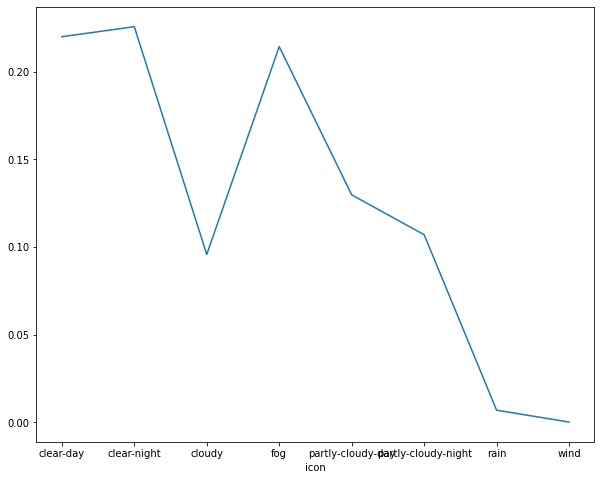

In [40]:
fe.plot()

In [41]:
fe_s = df_weather.groupby('summary').size()/len(df_weather)
df_weather.loc[:,'summary']=df_weather['summary'].map(fe_s)

In [42]:
fe_s

summary
Breezy and Foggy                 0.000147
Clear                            0.408767
Foggy                            0.214259
Humid                            0.037081
Humid and Foggy                  0.000147
Humid and Mostly Cloudy          0.060651
Humid and Overcast               0.052427
Humid and Partly Cloudy          0.042808
Light Rain                       0.000073
Light Rain and Humid             0.000294
Mostly Cloudy                    0.046846
Overcast                         0.043395
Partly Cloudy                    0.086570
Possible Drizzle                 0.000073
Possible Drizzle and Humid       0.000073
Possible Light Rain              0.001469
Possible Light Rain and Humid    0.003818
Rain                             0.000147
Rain and Humid                   0.000955
dtype: float64

<AxesSubplot:xlabel='summary'>

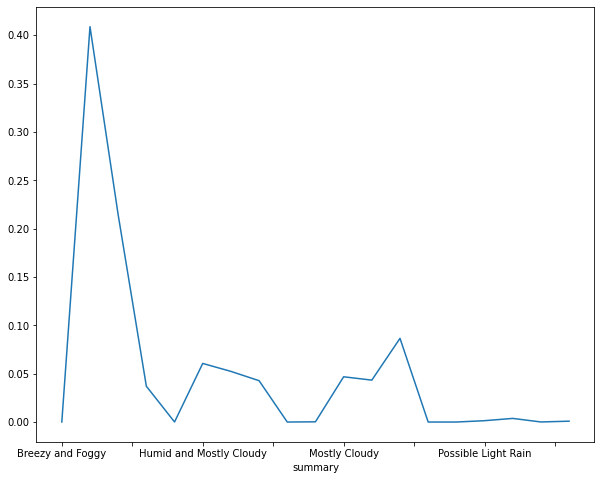

In [43]:
fe_s.plot()

In [44]:
fe_p = df_weather.groupby('precip_type').size()/len(df_weather)
df_weather.loc[:,'precip_type']=df_weather['precip_type'].map(fe_p)

In [45]:
fe_p

precip_type
-9999    0.025185
rain     0.451355
dtype: float64

In [46]:
df_weather.head()

,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_chill,wind_gust,heat_index,...,ozone,precip_accumulation,precip_intensity,precip_probability,precip_type,visibility,sunrise,sunset,icon,summary
datetime_local,,,,,,,,,,,,,,,,,,,,,
2017-10-01 00:00:00,0.0,26.52,26,1,19.46,308,0.83,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.57,2017-10-01 00:52:02,2017-10-01 12:45:07,0.225788,0.408767
2017-10-01 01:00:00,0.0,28.78,27,1,20.06,-9999,-9999.00,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.06,2017-10-01 00:52:02,2017-10-01 12:45:07,0.214406,0.214259
2017-10-01 02:00:00,0.0,26.58,26,1,19.97,-9999,-9999.00,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.06,2017-10-01 00:52:02,2017-10-01 12:45:07,0.214406,0.214259
2017-10-01 03:00:00,0.0,23.84,23,1,18.66,270,0.45,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.56,2017-10-01 00:52:02,2017-10-01 12:45:07,0.225788,0.408767
2017-10-01 04:00:00,0.0,24.13,24,1,17.84,-9999,-9999.00,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.06,2017-10-01 00:52:02,2017-10-01 12:45:07,0.214406,0.214259


In [47]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13619 entries, 2017-10-01 00:00:00 to 2019-09-30 23:00:00
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   cloud_cover           13619 non-null  float64       
 1   apparent_temperature  13619 non-null  float64       
 2   temperature           13619 non-null  int64         
 3   humidity              13619 non-null  int64         
 4   dew_point             13619 non-null  float64       
 5   wind_bearing          13619 non-null  int64         
 6   wind_speed            13619 non-null  float64       
 7   wind_chill            3744 non-null   float64       
 8   wind_gust             13619 non-null  float64       
 9   heat_index            3744 non-null   float64       
 10  pressure              13619 non-null  float64       
 11  qpf                   3744 non-null   float64       
 12  uv_index              13619 non-null  i

In [48]:
df_weather.isnull().sum()

cloud_cover                0
apparent_temperature       0
temperature                0
humidity                   0
dew_point                  0
wind_bearing               0
wind_speed                 0
wind_chill              9875
wind_gust                  0
heat_index              9875
pressure                   0
qpf                     9875
uv_index                   0
snow                    9875
pop                     9875
fctcode                 9875
ozone                      0
precip_accumulation     9875
precip_intensity           0
precip_probability         0
precip_type             7129
visibility                 0
sunrise                    0
sunset                     0
icon                       0
summary                    0
dtype: int64

In [49]:
df_weather['precip_type'].value_counts()

0.451355    6147
0.025185     343
Name: precip_type, dtype: int64

In [50]:
df_weather.describe()

,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_chill,wind_gust,heat_index,...,pop,fctcode,ozone,precip_accumulation,precip_intensity,precip_probability,precip_type,visibility,icon,summary
count,13619.000000,13619.000000,13619.000000,13619.000000,13619.000000,13619.000000,13619.000000,3744.0,13619.000000,3744.0,...,3744.0,3744.0,13619.000000,3744.0,13619.000000,13619.000000,6490.000000,13619.000000,13619.000000,13619.000000
mean,-314.005310,25.944639,24.498054,0.537411,11.924626,-498.677363,-540.808704,-9999.0,-2393.184251,-9999.0,...,-9999.0,-9999.0,-2187.730797,-9999.0,-2396.367775,-2396.398081,0.428831,-117.086149,0.182920,0.234222
std,1744.610028,10.469808,8.840016,0.498617,9.129459,2557.943872,2267.247300,0.0,4270.333680,0.0,...,0.0,0.0,4385.706548,0.0,4268.545854,4268.528833,0.095356,1130.763316,0.053470,0.156872
min,-9999.000000,3.140000,5.000000,0.000000,-20.560000,-9999.000000,-9999.000000,-9999.0,-9999.000000,-9999.0,...,-9999.0,-9999.0,-9999.000000,-9999.0,-9999.000000,-9999.000000,0.025185,-9999.000000,0.000147,0.000073
25%,0.000000,17.310000,17.000000,0.000000,5.920000,79.000000,1.620000,-9999.0,1.185000,-9999.0,...,-9999.0,-9999.0,236.900000,-9999.0,0.000000,0.000000,0.451355,3.540000,0.129819,0.060651
50%,0.000000,25.540000,25.000000,1.000000,10.710000,149.000000,2.410000,-9999.0,3.070000,-9999.0,...,-9999.0,-9999.0,270.800000,-9999.0,0.000000,0.000000,0.451355,16.090000,0.214406,0.214259
75%,0.410000,34.580000,31.000000,1.000000,19.670000,293.000000,3.330000,-9999.0,4.710000,-9999.0,...,-9999.0,-9999.0,280.800000,-9999.0,0.000000,0.000000,0.451355,16.090000,0.220060,0.408767
max,1.000000,49.750000,47.000000,1.000000,28.350000,359.000000,9.730000,-9999.0,15.150000,-9999.0,...,-9999.0,-9999.0,351.700000,-9999.0,6.220000,0.730000,0.451355,16.090000,0.225788,0.408767


In [51]:
df_weather=df_weather.drop(['sunrise','sunset'],axis=1)

In [52]:
df_weather.head()

,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_chill,wind_gust,heat_index,...,pop,fctcode,ozone,precip_accumulation,precip_intensity,precip_probability,precip_type,visibility,icon,summary
datetime_local,,,,,,,,,,,,,,,,,,,,,
2017-10-01 00:00:00,0.0,26.52,26,1,19.46,308,0.83,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.57,0.225788,0.408767
2017-10-01 01:00:00,0.0,28.78,27,1,20.06,-9999,-9999.00,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.06,0.214406,0.214259
2017-10-01 02:00:00,0.0,26.58,26,1,19.97,-9999,-9999.00,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.06,0.214406,0.214259
2017-10-01 03:00:00,0.0,23.84,23,1,18.66,270,0.45,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.56,0.225788,0.408767
2017-10-01 04:00:00,0.0,24.13,24,1,17.84,-9999,-9999.00,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.451355,3.06,0.214406,0.214259


In [53]:
df_weather.describe(include='all')

,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_chill,wind_gust,heat_index,...,pop,fctcode,ozone,precip_accumulation,precip_intensity,precip_probability,precip_type,visibility,icon,summary
count,13619.000000,13619.000000,13619.000000,13619.000000,13619.000000,13619.000000,13619.000000,3744.0,13619.000000,3744.0,...,3744.0,3744.0,13619.000000,3744.0,13619.000000,13619.000000,6490.000000,13619.000000,13619.000000,13619.000000
mean,-314.005310,25.944639,24.498054,0.537411,11.924626,-498.677363,-540.808704,-9999.0,-2393.184251,-9999.0,...,-9999.0,-9999.0,-2187.730797,-9999.0,-2396.367775,-2396.398081,0.428831,-117.086149,0.182920,0.234222
std,1744.610028,10.469808,8.840016,0.498617,9.129459,2557.943872,2267.247300,0.0,4270.333680,0.0,...,0.0,0.0,4385.706548,0.0,4268.545854,4268.528833,0.095356,1130.763316,0.053470,0.156872
min,-9999.000000,3.140000,5.000000,0.000000,-20.560000,-9999.000000,-9999.000000,-9999.0,-9999.000000,-9999.0,...,-9999.0,-9999.0,-9999.000000,-9999.0,-9999.000000,-9999.000000,0.025185,-9999.000000,0.000147,0.000073
25%,0.000000,17.310000,17.000000,0.000000,5.920000,79.000000,1.620000,-9999.0,1.185000,-9999.0,...,-9999.0,-9999.0,236.900000,-9999.0,0.000000,0.000000,0.451355,3.540000,0.129819,0.060651
50%,0.000000,25.540000,25.000000,1.000000,10.710000,149.000000,2.410000,-9999.0,3.070000,-9999.0,...,-9999.0,-9999.0,270.800000,-9999.0,0.000000,0.000000,0.451355,16.090000,0.214406,0.214259
75%,0.410000,34.580000,31.000000,1.000000,19.670000,293.000000,3.330000,-9999.0,4.710000,-9999.0,...,-9999.0,-9999.0,280.800000,-9999.0,0.000000,0.000000,0.451355,16.090000,0.220060,0.408767
max,1.000000,49.750000,47.000000,1.000000,28.350000,359.000000,9.730000,-9999.0,15.150000,-9999.0,...,-9999.0,-9999.0,351.700000,-9999.0,6.220000,0.730000,0.451355,16.090000,0.225788,0.408767


In [54]:
df_weather.replace(-9999, np.nan,inplace=True)
df_weather.fillna(0)

,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_chill,wind_gust,heat_index,...,pop,fctcode,ozone,precip_accumulation,precip_intensity,precip_probability,precip_type,visibility,icon,summary
datetime_local,,,,,,,,,,,,,,,,,,,,,
2017-10-01 00:00:00,0.00,26.52,26,1,19.46,308.0,0.83,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.451355,3.57,0.225788,0.408767
2017-10-01 01:00:00,0.00,28.78,27,1,20.06,0.0,0.00,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259
2017-10-01 02:00:00,0.00,26.58,26,1,19.97,0.0,0.00,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259
2017-10-01 03:00:00,0.00,23.84,23,1,18.66,270.0,0.45,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.451355,3.56,0.225788,0.408767
2017-10-01 04:00:00,0.00,24.13,24,1,17.84,0.0,0.00,0.0,0.00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-09-30 19:00:00,0.16,31.66,29,1,21.19,40.0,2.72,0.0,4.59,0.0,...,0.0,0.0,269.6,0.0,0.0,0.0,0.000000,16.09,0.107056,0.086570
2019-09-30 20:00:00,0.16,30.42,28,1,21.35,59.0,3.24,0.0,5.45,0.0,...,0.0,0.0,268.7,0.0,0.0,0.0,0.000000,16.09,0.107056,0.086570
2019-09-30 21:00:00,0.18,29.56,27,1,21.61,76.0,3.34,0.0,5.83,0.0,...,0.0,0.0,268.4,0.0,0.0,0.0,0.000000,16.09,0.107056,0.086570


In [55]:
df_weather.describe()

,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_chill,wind_gust,heat_index,...,pop,fctcode,ozone,precip_accumulation,precip_intensity,precip_probability,precip_type,visibility,icon,summary
count,13191.000000,13619.000000,13619.000000,13619.000000,13619.000000,12700.000000,12879.000000,0.0,10355.000000,0.0,...,0.0,0.0,10355.000000,0.0,10355.000000,10355.000000,6490.000000,13443.000000,13619.000000,13619.000000
mean,0.237562,25.944639,24.498054,0.537411,11.924626,188.786929,2.638890,NaN,4.245261,NaN,...,NaN,NaN,274.459707,NaN,0.058259,0.018400,0.428831,12.290986,0.182920,0.234222
std,0.342890,10.469808,8.840016,0.498617,9.129459,110.879924,1.290817,NaN,2.177424,NaN,...,NaN,NaN,15.247242,NaN,0.251135,0.055627,0.095356,6.211356,0.053470,0.156872
min,0.000000,3.140000,5.000000,0.000000,-20.560000,0.000000,0.000000,NaN,0.630000,NaN,...,NaN,NaN,225.800000,NaN,0.000000,0.000000,0.025185,0.000000,0.000147,0.000073
25%,0.000000,17.310000,17.000000,0.000000,5.920000,91.000000,1.760000,NaN,2.695000,NaN,...,NaN,NaN,267.800000,NaN,0.000000,0.000000,0.451355,3.670000,0.129819,0.060651
50%,0.010000,25.540000,25.000000,1.000000,10.710000,177.000000,2.520000,NaN,3.740000,NaN,...,NaN,NaN,275.600000,NaN,0.000000,0.000000,0.451355,16.090000,0.214406,0.214259
75%,0.430000,34.580000,31.000000,1.000000,19.670000,298.000000,3.400000,NaN,5.340000,NaN,...,NaN,NaN,283.900000,NaN,0.010000,0.010000,0.451355,16.090000,0.220060,0.408767
max,1.000000,49.750000,47.000000,1.000000,28.350000,359.000000,9.730000,NaN,15.150000,NaN,...,NaN,NaN,351.700000,NaN,6.220000,0.730000,0.451355,16.090000,0.225788,0.408767


In [56]:
df_weather.isnull().sum()

cloud_cover               428
apparent_temperature        0
temperature                 0
humidity                    0
dew_point                   0
wind_bearing              919
wind_speed                740
wind_chill              13619
wind_gust                3264
heat_index              13619
pressure                 2156
qpf                     13619
uv_index                 3264
snow                    13619
pop                     13619
fctcode                 13619
ozone                    3264
precip_accumulation     13619
precip_intensity         3264
precip_probability       3264
precip_type              7129
visibility                176
icon                        0
summary                     0
dtype: int64

In [57]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13619 entries, 2017-10-01 00:00:00 to 2019-09-30 23:00:00
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   cloud_cover           13191 non-null  float64
 1   apparent_temperature  13619 non-null  float64
 2   temperature           13619 non-null  int64  
 3   humidity              13619 non-null  int64  
 4   dew_point             13619 non-null  float64
 5   wind_bearing          12700 non-null  float64
 6   wind_speed            12879 non-null  float64
 7   wind_chill            0 non-null      float64
 8   wind_gust             10355 non-null  float64
 9   heat_index            0 non-null      float64
 10  pressure              11463 non-null  float64
 11  qpf                   0 non-null      float64
 12  uv_index              10355 non-null  float64
 13  snow                  0 non-null      float64
 14  pop                   0 non-null   

<AxesSubplot:>

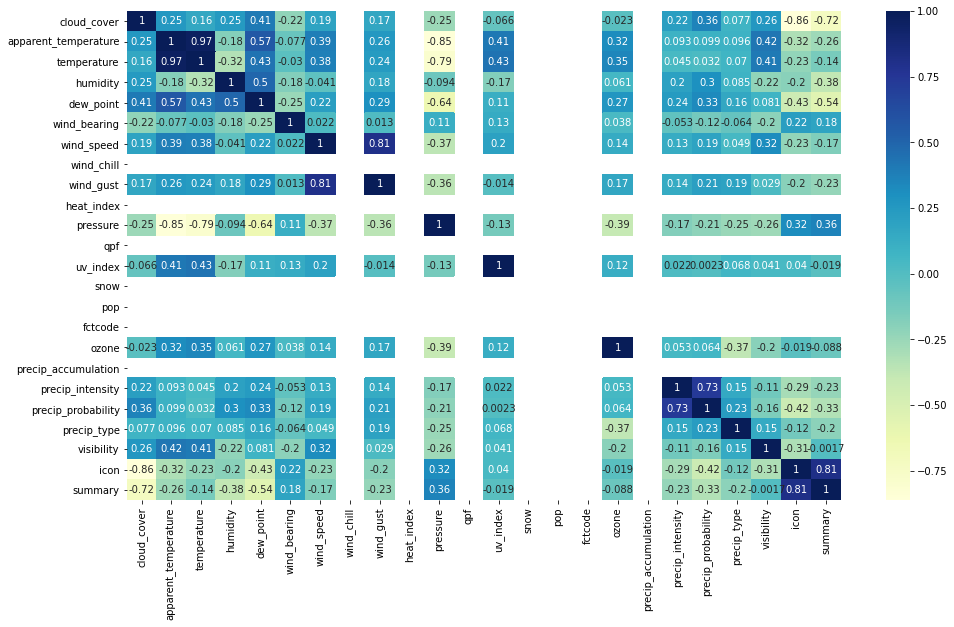

In [58]:
f, ax = plt.subplots(figsize=(16,9))
sns.heatmap(df_weather.corr(),cmap="YlGnBu",annot=True)

In [59]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13619 entries, 2017-10-01 00:00:00 to 2019-09-30 23:00:00
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   cloud_cover           13191 non-null  float64
 1   apparent_temperature  13619 non-null  float64
 2   temperature           13619 non-null  int64  
 3   humidity              13619 non-null  int64  
 4   dew_point             13619 non-null  float64
 5   wind_bearing          12700 non-null  float64
 6   wind_speed            12879 non-null  float64
 7   wind_chill            0 non-null      float64
 8   wind_gust             10355 non-null  float64
 9   heat_index            0 non-null      float64
 10  pressure              11463 non-null  float64
 11  qpf                   0 non-null      float64
 12  uv_index              10355 non-null  float64
 13  snow                  0 non-null      float64
 14  pop                   0 non-null   

In [60]:
df1=df_weather.copy()

In [61]:
df1.fillna(0,inplace=True)

In [62]:
df1.drop(['precip_accumulation','fctcode','pop','snow','qpf','heat_index','wind_chill'],inplace=True,axis=1)

In [63]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13619 entries, 2017-10-01 00:00:00 to 2019-09-30 23:00:00
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   cloud_cover           13619 non-null  float64
 1   apparent_temperature  13619 non-null  float64
 2   temperature           13619 non-null  int64  
 3   humidity              13619 non-null  int64  
 4   dew_point             13619 non-null  float64
 5   wind_bearing          13619 non-null  float64
 6   wind_speed            13619 non-null  float64
 7   wind_gust             13619 non-null  float64
 8   pressure              13619 non-null  float64
 9   uv_index              13619 non-null  float64
 10  ozone                 13619 non-null  float64
 11  precip_intensity      13619 non-null  float64
 12  precip_probability    13619 non-null  float64
 13  precip_type           13619 non-null  float64
 14  visibility            13619 non-nul

In [64]:
df1 = df1.resample('1H').pad()

In [65]:
df1.head()

,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_gust,pressure,uv_index,ozone,precip_intensity,precip_probability,precip_type,visibility,icon,summary
datetime_local,,,,,,,,,,,,,,,,,
2017-10-01 00:00:00,0.0,26.52,26,1,19.46,308.0,0.83,0.0,1007.90,0.0,0.0,0.0,0.0,0.451355,3.57,0.225788,0.408767
2017-10-01 01:00:00,0.0,28.78,27,1,20.06,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259
2017-10-01 02:00:00,0.0,26.58,26,1,19.97,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259
2017-10-01 03:00:00,0.0,23.84,23,1,18.66,270.0,0.45,0.0,1008.12,0.0,0.0,0.0,0.0,0.451355,3.56,0.225788,0.408767
2017-10-01 04:00:00,0.0,24.13,24,1,17.84,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259


In [66]:
df2= pd.concat([df,df1],axis=1)

In [67]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17520 entries, 2017-10-01 00:00:00 to 2019-09-30 23:00:00
Freq: H
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   power                 17520 non-null  float64
 1   cloud_cover           17520 non-null  float64
 2   apparent_temperature  17520 non-null  float64
 3   temperature           17520 non-null  int64  
 4   humidity              17520 non-null  int64  
 5   dew_point             17520 non-null  float64
 6   wind_bearing          17520 non-null  float64
 7   wind_speed            17520 non-null  float64
 8   wind_gust             17520 non-null  float64
 9   pressure              17520 non-null  float64
 10  uv_index              17520 non-null  float64
 11  ozone                 17520 non-null  float64
 12  precip_intensity      17520 non-null  float64
 13  precip_probability    17520 non-null  float64
 14  precip_type           17520

In [68]:
df2.describe(include='all')

,power,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_gust,pressure,uv_index,ozone,precip_intensity,precip_probability,precip_type,visibility,icon,summary
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000
mean,28.612915,0.178863,25.245933,24.145320,0.427340,10.444118,211.535902,2.268933,3.176858,885.228147,1.105993,228.155667,0.034433,0.010875,0.164461,9.430807,0.192465,0.273086
std,487.944707,0.314675,9.325530,7.824069,0.494706,8.536539,122.691590,1.297273,2.321461,331.679424,2.430003,110.158910,0.195179,0.043711,0.211153,7.521820,0.050404,0.156213
min,0.000000,0.000000,3.140000,5.000000,0.000000,-20.560000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000147,0.000073
25%,0.000000,0.000000,19.770000,20.000000,0.000000,4.980000,97.000000,1.490000,1.920000,1000.740000,0.000000,254.800000,0.000000,0.000000,0.000000,0.640000,0.129819,0.086570
50%,0.000000,0.000000,22.910000,23.000000,0.000000,7.880000,260.000000,1.990000,3.070000,1010.460000,0.000000,276.500000,0.000000,0.000000,0.025185,16.090000,0.220060,0.408767
75%,5.852500,0.230000,32.152500,30.000000,1.000000,16.290000,335.000000,3.050000,4.120000,1012.980000,0.000000,294.705000,0.000000,0.000000,0.451355,16.090000,0.225788,0.408767
max,15091.685000,1.000000,49.750000,47.000000,1.000000,28.350000,359.000000,9.730000,15.150000,1025.690000,12.000000,351.700000,6.220000,0.730000,0.451355,16.090000,0.225788,0.408767


In [69]:
df2.head()

,power,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_gust,pressure,uv_index,ozone,precip_intensity,precip_probability,precip_type,visibility,icon,summary
datetime,,,,,,,,,,,,,,,,,,
2017-10-01 00:00:00,0.0,0.0,26.52,26,1,19.46,308.0,0.83,0.0,1007.90,0.0,0.0,0.0,0.0,0.451355,3.57,0.225788,0.408767
2017-10-01 01:00:00,0.0,0.0,28.78,27,1,20.06,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259
2017-10-01 02:00:00,0.0,0.0,26.58,26,1,19.97,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259
2017-10-01 03:00:00,0.0,0.0,23.84,23,1,18.66,270.0,0.45,0.0,1008.12,0.0,0.0,0.0,0.0,0.451355,3.56,0.225788,0.408767
2017-10-01 04:00:00,0.0,0.0,24.13,24,1,17.84,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259


### Saving Final Cleaned Weather Data

In [70]:
df2.to_csv('final_cleaned_data.csv')

In [71]:
pd.date_range(start = '2017-10-01', end = '2019-09-30' ).difference(df_weather.index)

DatetimeIndex(['2018-02-28', '2018-03-01', '2018-03-02', '2018-03-03',
               '2018-03-04', '2018-03-05', '2018-03-06', '2018-03-13',
               '2018-03-14', '2018-03-15',
               ...
               '2018-08-06', '2018-08-07', '2018-08-08', '2018-08-09',
               '2018-08-10', '2018-08-11', '2018-08-12', '2018-08-13',
               '2018-08-14', '2018-08-15'],
              dtype='datetime64[ns]', length=163, freq=None)

<AxesSubplot:>

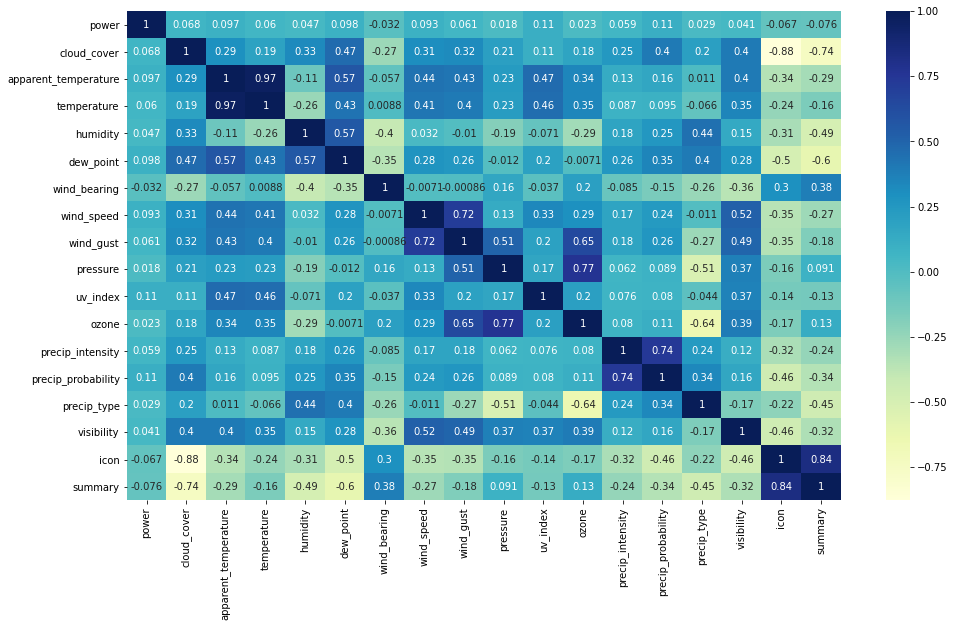

In [72]:
f, ax = plt.subplots(figsize=(16,9))
sns.heatmap(df2.corr(),cmap="YlGnBu",annot=True)

<AxesSubplot:xlabel='datetime'>

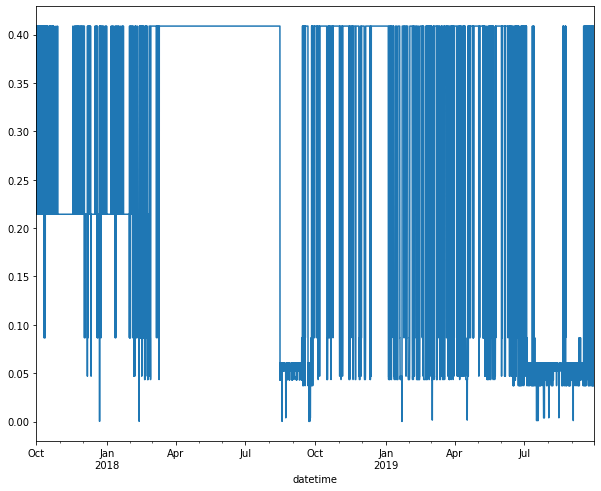

In [73]:
energy_series = df2.loc[:, ('summary')]
energy_series.plot()

<AxesSubplot:xlabel='datetime'>

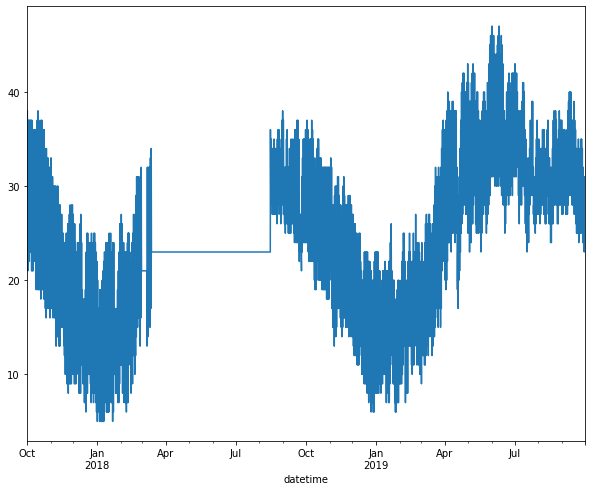

In [74]:
temperature_series=df2.loc[:,('temperature')]
temperature_series.plot()

<AxesSubplot:xlabel='datetime'>

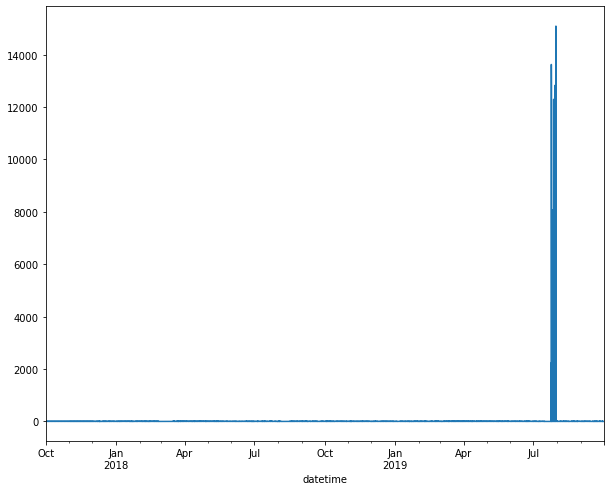

In [75]:
power_series=df2.loc[:,('power')]
power_series.plot()

### Preprocessing the Test Data

In [76]:
df_weather_forecast=pd.read_csv('weather_forecast.csv')

In [77]:
df_weather_forecast=df_weather_forecast.drop(['datetime_utc','plant_id','Unnamed: 0','updated_at','sunset','sunrise','plant_id'], axis=1)

In [78]:
df_weather_forecast['datetime_local']=pd.to_datetime(df_weather_forecast['datetime_local'])

In [79]:
df_weather_forecast.set_index('datetime_local',inplace=True)

In [80]:
pd.date_range(start = '2019-10-01', end = '2019-10-27' ).difference(df_weather_forecast.index)

DatetimeIndex([], dtype='datetime64[ns]', freq=None)

In [81]:
df_weather_forecast.drop(['precip_accumulation','fctcode','pop','snow','qpf','heat_index','wind_chill'],inplace=True,axis=1)

In [82]:
df_weather_forecast.shape

(648, 17)

In [83]:
df_weather_forecast['precip_type'].value_counts()

rain    114
Name: precip_type, dtype: int64

### Feature Engineering

In [84]:
df_weather_forecast.fillna(0,axis=1,inplace=True)

In [85]:
df_weather_forecast.isnull().sum()

cloud_cover             0
apparent_temperature    0
temperature             0
humidity                0
dew_point               0
wind_bearing            0
wind_speed              0
wind_gust               0
pressure                0
uv_index                0
ozone                   0
precip_intensity        0
precip_probability      0
precip_type             0
visibility              0
icon                    0
summary                 0
dtype: int64

In [86]:
df_weather_forecast.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 648 entries, 2019-10-01 00:00:00 to 2019-10-27 23:00:00
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   cloud_cover           648 non-null    float64
 1   apparent_temperature  648 non-null    float64
 2   temperature           648 non-null    int64  
 3   humidity              648 non-null    int64  
 4   dew_point             648 non-null    float64
 5   wind_bearing          648 non-null    int64  
 6   wind_speed            648 non-null    float64
 7   wind_gust             648 non-null    float64
 8   pressure              648 non-null    float64
 9   uv_index              648 non-null    int64  
 10  ozone                 648 non-null    float64
 11  precip_intensity      648 non-null    float64
 12  precip_probability    648 non-null    float64
 13  precip_type           648 non-null    object 
 14  visibility            648 non-null   

In [87]:
se = df_weather_forecast.groupby('icon').size()/len(df_weather_forecast)
df_weather_forecast.loc[:,'icon']=df_weather_forecast['icon'].map(se)

In [88]:
se_s = df_weather_forecast.groupby('summary').size()/len(df_weather_forecast)
df_weather_forecast.loc[:,'summary']=df_weather_forecast['summary'].map(se_s)

In [89]:
se_p = df_weather_forecast.groupby('precip_type').size()/len(df_weather_forecast)
df_weather_forecast.loc[:,'precip_type']=df_weather_forecast['precip_type'].map(se_p)

In [90]:
df_weather_forecast.head()

,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_gust,pressure,uv_index,ozone,precip_intensity,precip_probability,precip_type,visibility,icon,summary
datetime_local,,,,,,,,,,,,,,,,,
2019-10-01 00:00:00,0.35,26.41,26,1,22.01,101,3.08,6.42,1008.45,0,268.6,0.0,0.0,0.824074,16.09,0.098765,0.112654
2019-10-01 01:00:00,0.43,25.95,25,1,22.06,105,2.94,6.28,1008.24,0,269.1,0.0,0.0,0.824074,16.09,0.098765,0.112654
2019-10-01 02:00:00,0.48,25.46,25,1,22.06,106,2.82,6.08,1007.90,0,269.7,0.0,0.0,0.824074,16.09,0.098765,0.112654
2019-10-01 03:00:00,0.49,24.80,24,1,21.87,106,2.63,5.74,1007.61,0,270.4,0.0,0.0,0.824074,16.09,0.098765,0.112654
2019-10-01 04:00:00,0.49,23.99,23,1,21.53,100,2.39,5.30,1007.51,0,271.3,0.0,0.0,0.824074,16.09,0.098765,0.112654


In [91]:
df_weather_forecast['power']=''

In [92]:
df_weather_forecast['power']=pd.to_numeric(df_weather_forecast['power'],errors='coerce')

In [93]:
df_weather_forecast.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 648 entries, 2019-10-01 00:00:00 to 2019-10-27 23:00:00
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   cloud_cover           648 non-null    float64
 1   apparent_temperature  648 non-null    float64
 2   temperature           648 non-null    int64  
 3   humidity              648 non-null    int64  
 4   dew_point             648 non-null    float64
 5   wind_bearing          648 non-null    int64  
 6   wind_speed            648 non-null    float64
 7   wind_gust             648 non-null    float64
 8   pressure              648 non-null    float64
 9   uv_index              648 non-null    int64  
 10  ozone                 648 non-null    float64
 11  precip_intensity      648 non-null    float64
 12  precip_probability    648 non-null    float64
 13  precip_type           648 non-null    float64
 14  visibility            648 non-null   

In [94]:
df2.head()

,power,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_gust,pressure,uv_index,ozone,precip_intensity,precip_probability,precip_type,visibility,icon,summary
datetime,,,,,,,,,,,,,,,,,,
2017-10-01 00:00:00,0.0,0.0,26.52,26,1,19.46,308.0,0.83,0.0,1007.90,0.0,0.0,0.0,0.0,0.451355,3.57,0.225788,0.408767
2017-10-01 01:00:00,0.0,0.0,28.78,27,1,20.06,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259
2017-10-01 02:00:00,0.0,0.0,26.58,26,1,19.97,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259
2017-10-01 03:00:00,0.0,0.0,23.84,23,1,18.66,270.0,0.45,0.0,1008.12,0.0,0.0,0.0,0.0,0.451355,3.56,0.225788,0.408767
2017-10-01 04:00:00,0.0,0.0,24.13,24,1,17.84,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.451355,3.06,0.214406,0.214259


In [95]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17520 entries, 2017-10-01 00:00:00 to 2019-09-30 23:00:00
Freq: H
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   power                 17520 non-null  float64
 1   cloud_cover           17520 non-null  float64
 2   apparent_temperature  17520 non-null  float64
 3   temperature           17520 non-null  int64  
 4   humidity              17520 non-null  int64  
 5   dew_point             17520 non-null  float64
 6   wind_bearing          17520 non-null  float64
 7   wind_speed            17520 non-null  float64
 8   wind_gust             17520 non-null  float64
 9   pressure              17520 non-null  float64
 10  uv_index              17520 non-null  float64
 11  ozone                 17520 non-null  float64
 12  precip_intensity      17520 non-null  float64
 13  precip_probability    17520 non-null  float64
 14  precip_type           17520

### Train Test Split

In [96]:
train_data=df2.loc['2017-10-01':'2019-07-30']

In [97]:
val_data=df2.loc['2019-08-01':'2019-08-31']

In [98]:
test_data=df2.loc['2019-08-01':'2019-09-30']

### Feature Scaling

In [99]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [100]:
clean_train_data=train_data.copy()

In [101]:
clean_val_data=val_data.copy()

In [102]:
clean_test_data=test_data.copy()

In [103]:
x_train,y_train=clean_train_data.drop(['power'],axis=1),clean_train_data.power

In [104]:
x_test, y_test=clean_test_data.drop(['power'],axis=1),clean_test_data.power

In [105]:
x_val, y_val=clean_val_data.drop(['power'],axis=1),clean_val_data.power

In [106]:
x_test.shape

(1464, 17)

In [107]:
x_train.shape

(16032, 17)

In [108]:
x_val.shape

(744, 17)

In [109]:
scaler=StandardScaler()

In [110]:
x_train_scaled=scaler.fit_transform(x_train)
x_test_scaled=scaler.fit_transform(x_test)
x_val_scaled=scaler.fit_transform(x_val)

In [111]:
x_train_reshaped=x_train_scaled.reshape((x_train_scaled.shape[0],1,x_train_scaled.shape[1]))

In [112]:
x_val_reshaped=x_val_scaled.reshape((x_val_scaled.shape[0],1,x_val_scaled.shape[1]))

### LSTM Modelling

In [113]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

In [251]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(25, input_shape= (1,17), return_sequences=True))
model.add(tf.keras.layers.ReLU()) 
model.add(tf.keras.layers.LSTM(25, return_sequences=True))
model.add(tf.keras.layers.ReLU()) 
model.add(tf.keras.layers.Dropout(0.1)) 
model.add(tf.keras.layers.LSTM(5, return_sequences=False))
model.add(tf.keras.layers.Dropout(0.1)) 
model.add(tf.keras.layers.Dense(3))

In [252]:
model.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_31 (LSTM)               (None, 1, 25)             4300      
_________________________________________________________________
re_lu_18 (ReLU)              (None, 1, 25)             0         
_________________________________________________________________
lstm_32 (LSTM)               (None, 1, 25)             5100      
_________________________________________________________________
re_lu_19 (ReLU)              (None, 1, 25)             0         
_________________________________________________________________
dropout_18 (Dropout)         (None, 1, 25)             0         
_________________________________________________________________
lstm_33 (LSTM)               (None, 5)                 620       
_________________________________________________________________
dropout_19 (Dropout)         (None, 5)               

In [253]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=2,
                                                    mode='min')

model.compile(loss=tf.losses.MeanSquaredError(),
              optimizer=tf.optimizers.Adam(lr=0.001),
              metrics=[tf.keras.metrics.MeanAbsoluteError()])

history = model.fit(x_train_reshaped,y_train, epochs=200,
                    validation_data=(x_val_reshaped,y_val),
                    shuffle=False)

Epoch 1/200
501/501 [==============================] - 3s 6ms/step - loss: 260931.2188 - mean_absolute_error: 31.2826 - val_loss: 17.9854 - val_mean_absolute_error: 3.0966
Epoch 2/200
501/501 [==============================] - 2s 3ms/step - loss: 260887.4219 - mean_absolute_error: 31.4072 - val_loss: 15.9234 - val_mean_absolute_error: 2.5712
Epoch 3/200
501/501 [==============================] - 2s 3ms/step - loss: 260859.0000 - mean_absolute_error: 31.2808 - val_loss: 15.1265 - val_mean_absolute_error: 2.6614
Epoch 4/200
501/501 [==============================] - 2s 3ms/step - loss: 260848.0156 - mean_absolute_error: 31.2866 - val_loss: 14.5729 - val_mean_absolute_error: 2.6283
Epoch 5/200
501/501 [==============================] - 2s 3ms/step - loss: 260834.9062 - mean_absolute_error: 31.2321 - val_loss: 14.0840 - val_mean_absolute_error: 2.5846
Epoch 6/200
501/501 [==============================] - 2s 3ms/step - loss: 260826.0000 - mean_absolute_error: 31.1672 - val_loss: 13.5341 - 

In [134]:
from matplotlib import pylab as plt

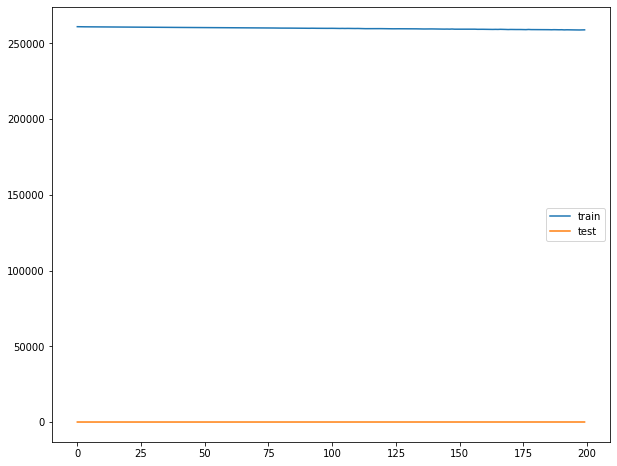

In [254]:
plt.plot(history.history['loss'],label='train')
plt.plot(history.history['val_loss'],label='test')
plt.legend()

In [136]:
x_test_reshaped=x_test_scaled.reshape((x_test_scaled.shape[0],1,x_test_scaled.shape[1]))

In [255]:
pred = model.predict(x_test_reshaped)

In [256]:
pred.shape

(1464, 3)

In [241]:
test_data['power_pred']=pred

C:\Users\suraj\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [259]:
test_data.head()

,power,cloud_cover,apparent_temperature,temperature,humidity,dew_point,wind_bearing,wind_speed,wind_gust,pressure,uv_index,ozone,precip_intensity,precip_probability,precip_type,visibility,icon,summary,power_pred,power_pred1
datetime,,,,,,,,,,,,,,,,,,,,
2019-08-01 00:00:00,0.0,0.99,36.36,30,1,25.01,121.0,3.45,6.34,999.06,0.0,280.3,0.00,0.00,0.000000,16.09,0.095822,0.052427,0.338723,0.186789
2019-08-01 01:00:00,0.0,0.99,35.66,30,1,24.94,126.0,3.52,6.44,998.69,0.0,280.3,0.00,0.00,0.000000,16.09,0.095822,0.052427,0.325856,0.178427
2019-08-01 02:00:00,0.0,0.99,34.88,29,1,25.01,128.0,3.55,6.49,998.46,0.0,280.2,0.00,0.00,0.000000,16.09,0.095822,0.052427,0.385216,0.193334
2019-08-01 03:00:00,0.0,0.98,33.43,28,1,25.14,124.0,3.46,6.53,998.59,0.0,280.3,0.07,0.09,0.451355,16.09,0.095822,0.052427,0.402874,0.190655
2019-08-01 04:00:00,0.0,0.95,31.50,27,1,25.20,114.0,3.25,6.55,998.78,0.0,280.4,0.36,0.17,0.451355,16.09,0.095822,0.052427,0.528821,0.294492


<AxesSubplot:xlabel='datetime'>

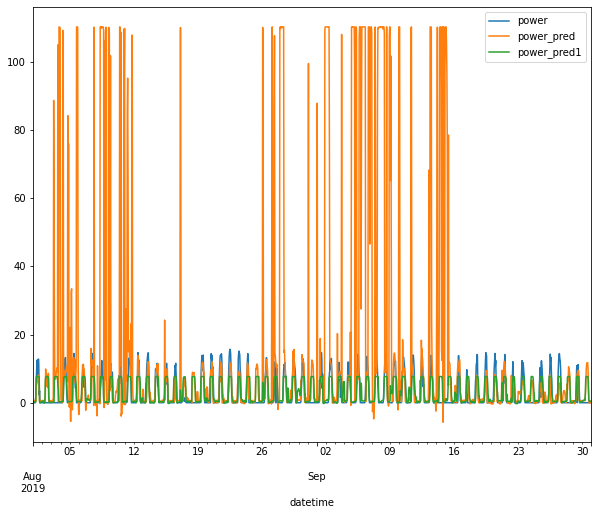

In [243]:
power_series=test_data.loc[:,('power','power_pred','power_pred1')]
power_series.plot()

In [244]:
fig=px.line(test_data,y=['power_pred','power','power_pred1'],title='Energy generation')

fig.update_xaxes(
    rangeslider_visible= True,
    rangeselector=dict(
                        buttons = list([
                        dict(count = 1,label = '1m',step='month',stepmode = "backward"),
                        dict(count = 2,label = '6m',step='month',stepmode = "backward"),
                        dict(count = 3,label = '6mYTD',step='month',stepmode = "todate"),
                        dict(count = 4,label = '2y',step='year',stepmode = "backward"),
                        dict(count = 5,label = '3y',step='year',stepmode = "backward"),
                        dict(step= 'all')
                            ])        
                        )
                   )
fig.show()

In [260]:
fig=px.line(test_data,y=['power','power_pred1'],title='Energy generation')

fig.update_xaxes(
    rangeslider_visible= True,
    rangeselector=dict(
                        buttons = list([
                        dict(count = 1,label = '1m',step='month',stepmode = "backward"),
                        dict(count = 2,label = '6m',step='month',stepmode = "backward"),
                        dict(count = 3,label = '6mYTD',step='month',stepmode = "todate"),
                        dict(count = 4,label = '2y',step='year',stepmode = "backward"),
                        dict(count = 5,label = '3y',step='year',stepmode = "backward"),
                        dict(step= 'all')
                            ])        
                        )
                   )
fig.show()

### Test Forecasting for the Month of October

In [143]:
new_test=df_weather_forecast.loc['2019-10-01':'2019-10-27']

In [144]:
x_test_n, y_test_n=new_test.drop(['power'],axis=1),new_test.power

In [145]:
x_new_test_scaled=scaler.fit_transform(x_test_n)

In [146]:
x_new_test_reshaped=x_new_test_scaled.reshape((x_new_test_scaled.shape[0],1,x_new_test_scaled.shape[1]))

In [147]:
x_test_reshaped.shape

(1464, 1, 17)

In [247]:
preds = model.predict(x_new_test_reshaped)

In [249]:
new_test['power_pred']=preds

C:\Users\suraj\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<AxesSubplot:xlabel='datetime_local'>

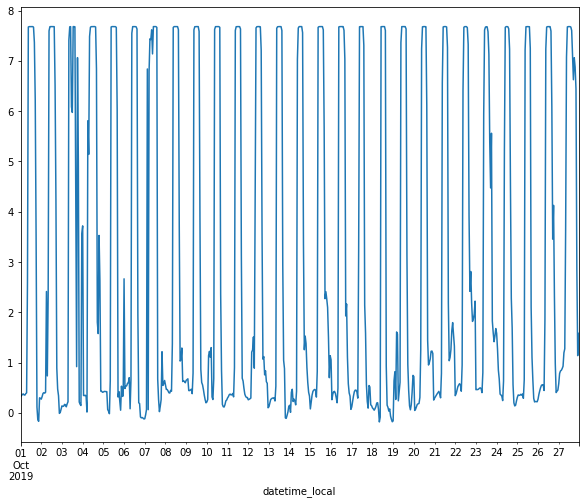

In [151]:
power_series=new_test.loc[:,'power_pred']
power_series.plot()

In [152]:
fig=px.line(new_test,y='power_pred',title='Energy generation')

fig.update_xaxes(
    rangeslider_visible= True,
    rangeselector=dict(
                        buttons = list([
                        dict(count = 1,label = '1m',step='month',stepmode = "backward"),
                        dict(count = 2,label = '6m',step='month',stepmode = "backward"),
                        dict(count = 3,label = '6mYTD',step='month',stepmode = "todate"),
                        dict(count = 4,label = '2y',step='year',stepmode = "backward"),
                        dict(count = 5,label = '3y',step='year',stepmode = "backward"),
                        dict(step= 'all')
                            ])        
                        )
                   )
fig.show()

In [ ]:
new_test.to_csv('forecast_October_2019.csv')